In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import statistics
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import statistics as stat
from scipy.stats import binom
from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Rectangle
# splitting merge_data into train test and split
from sklearn.model_selection import train_test_split, cross_validate
from scipy import stats
from scipy.stats import normaltest
import os 
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
import matplotlib as mpl
import warnings; warnings.filterwarnings(action='once')
# to keep track of training time
import datetime
# logistic regression model
from sklearn.linear_model import LogisticRegression
# metrics used for evaluation
from sklearn.metrics import f1_score, matthews_corrcoef
# visualizations
from yellowbrick.classifier import ClassPredictionError, ConfusionMatrix
from sklearn.metrics import plot_roc_curve
# KNN imputation
from sklearn.impute import KNNImputer
# normalizer
from sklearn.preprocessing import Normalizer
# variance threshold
from sklearn.feature_selection import VarianceThreshold
# RFECV
from sklearn.model_selection import StratifiedKFold
# random forest
from sklearn.ensemble import RandomForestClassifier
# evaluation metric


c:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\style\colors.py:35: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\ProgramData\Anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

c:\ProgramData\Anaconda3\lib\site-packages\yellowbrick\style\rcmod.py:31: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [2]:
df = pd.read_csv("LoanStats.csv")

In [3]:
df.shape

(39786, 7)

## Data Understanding

In [4]:
observed1 = df["term"].value_counts()
observed1

36    29096
60    10690
Name: term, dtype: int64

In [5]:
#plt.scatter(df.loan_amnt,df.int_rate)

In [6]:
import plotly.express as px
fig = px.box(df, x="term", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [7]:
observed = df["purpose"].value_counts()
observed

debt_consolidation    18676
credit_card            5137
other                  4001
home_improvement       2985
major_purchase         2188
small_business         1831
car                    1551
wedding                 948
medical                 695
moving                  583
house                   382
vacation                381
educational             325
renewable_energy        103
Name: purpose, dtype: int64

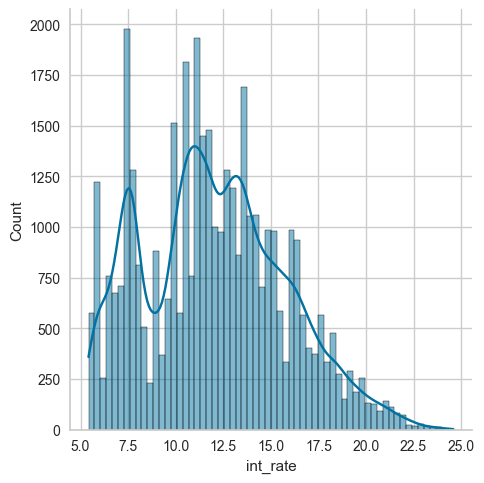

In [8]:
sns.displot(data=df, x="int_rate", kde=True)

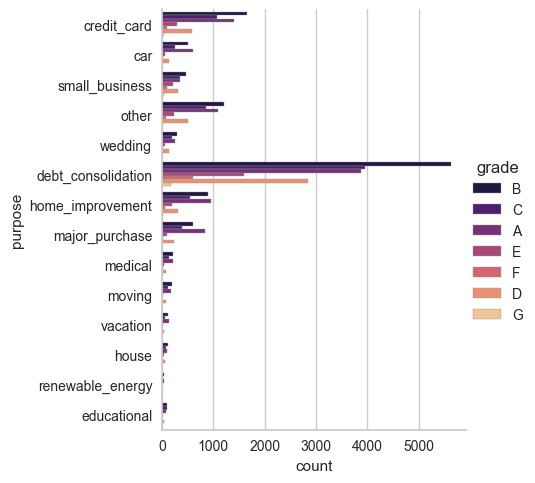

In [9]:

sns.catplot(
    data=df, y="purpose", hue="grade", kind="count",
    palette="magma", edgecolor=".6",
)

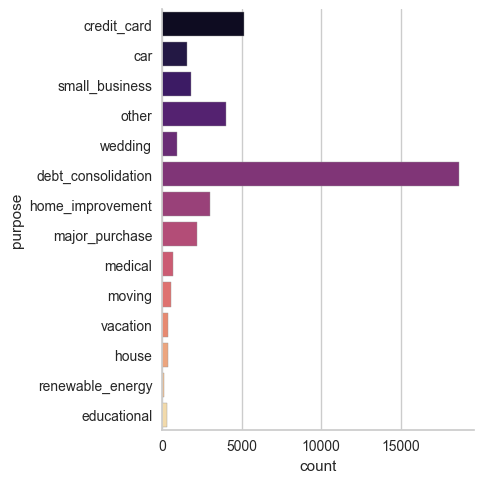

In [10]:
sns.catplot(
    data=df, y="purpose", kind="count",
    palette="magma", edgecolor=".6",
)

In [11]:
df.describe()

,int_rate,loan_amnt,term,annual_inc
count,39786.000000,39786.000000,39786.000000,3.978600e+04
mean,12.027873,11231.360277,42.448499,6.897907e+04
std,3.727466,7464.542832,10.638782,6.376263e+04
min,5.420000,500.000000,36.000000,4.000000e+03
25%,9.250000,5500.000000,36.000000,4.050000e+04
50%,11.860000,10000.000000,36.000000,5.900000e+04
75%,14.590000,15000.000000,60.000000,8.234250e+04
max,24.590000,35000.000000,60.000000,6.000000e+06


In [12]:
import plotly.express as px
fig = px.box(df, x="purpose", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [13]:
import plotly.express as px
fig = px.box(df, x="grade", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [14]:
import plotly.express as px

fig = px.box(df, x="purpose", y="int_rate", color="home_ownership")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [15]:
fig = px.box(df, x="purpose", y="int_rate", color="grade")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



## Data Preparation

In [16]:
#Checking if there is any missing value in the data 
df.isna().any().any()

False

In [17]:
df.columns

Index(['int_rate', 'loan_amnt', 'term', 'grade', 'home_ownership',
       'annual_inc', 'purpose'],
      dtype='object')

In [18]:
df.head()

,int_rate,loan_amnt,term,grade,home_ownership,annual_inc,purpose
0,10.65,5000,36,B,RENT,24000.0,credit_card
1,15.27,2500,60,C,RENT,30000.0,car
2,15.96,2400,36,C,RENT,12252.0,small_business
3,13.49,10000,36,C,RENT,49200.0,other
4,12.69,3000,60,B,RENT,80000.0,other


In [19]:
print(df.dtypes)

int_rate          float64
loan_amnt           int64
term                int64
grade              object
home_ownership     object
annual_inc        float64
purpose            object
dtype: object


In [20]:
# one hot encoding for nomial variables 
dummies1= pd.get_dummies(df.home_ownership)

In [21]:
dummies2= pd.get_dummies(df.purpose)

In [22]:
dummies3= pd.get_dummies(df.grade)

In [23]:
merged =pd.concat([df,dummies1,dummies2,dummies3],axis="columns")

In [24]:
merged

,int_rate,loan_amnt,term,grade,home_ownership,annual_inc,purpose,MORTGAGE,NONE,OTHER,...,small_business,vacation,wedding,A,B,C,D,E,F,G
0,10.65,5000,36,B,RENT,24000.0,credit_card,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,15.27,2500,60,C,RENT,30000.0,car,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,15.96,2400,36,C,RENT,12252.0,small_business,0,0,0,...,1,0,0,0,0,1,0,0,0,0
3,13.49,10000,36,C,RENT,49200.0,other,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,12.69,3000,60,B,RENT,80000.0,other,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39781,8.07,2500,36,A,MORTGAGE,110000.0,home_improvement,1,0,0,...,0,0,0,1,0,0,0,0,0,0
39782,10.28,8500,36,C,RENT,18000.0,credit_card,0,0,0,...,0,0,0,0,0,1,0,0,0,0
39783,8.07,5000,36,A,MORTGAGE,100000.0,debt_consolidation,1,0,0,...,0,0,0,1,0,0,0,0,0,0
39784,7.43,5000,36,A,MORTGAGE,200000.0,other,1,0,0,...,0,0,0,1,0,0,0,0,0,0


In [26]:
#dropping categorical variables 
df_final= merged.drop(["home_ownership","purpose","grade","moving","other","D"], axis="columns")

In [27]:
df_final

,int_rate,loan_amnt,term,annual_inc,MORTGAGE,NONE,OTHER,OWN,RENT,car,...,renewable_energy,small_business,vacation,wedding,A,B,C,E,F,G
0,10.65,5000,36,24000.0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
1,15.27,2500,60,30000.0,0,0,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0
2,15.96,2400,36,12252.0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,0,0
3,13.49,10000,36,49200.0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
4,12.69,3000,60,80000.0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39781,8.07,2500,36,110000.0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
39782,10.28,8500,36,18000.0,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0
39783,8.07,5000,36,100000.0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
39784,7.43,5000,36,200000.0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [45]:
df_final.corr()

,int_rate,loan_amnt,term,annual_inc,MORTGAGE,NONE,OTHER,OWN,RENT,car,...,renewable_energy,small_business,vacation,wedding,A,B,C,E,F,G
int_rate,1.000000,0.310481,0.452884,0.053485,-0.059096,-0.007761,0.000174,-0.019677,0.069430,-0.080502,...,-0.008068,0.058098,-0.030912,-0.005744,-0.733599,-0.177781,0.207133,0.424633,0.341885,0.225580
loan_amnt,0.310481,1.000000,0.362123,0.271340,0.177249,-0.006551,-0.003784,-0.037203,-0.156032,-0.120229,...,-0.017160,0.069101,-0.075983,-0.028321,-0.203470,-0.009504,-0.014532,0.173106,0.158100,0.108723
term,0.452884,0.362123,1.000000,0.046809,0.107642,-0.005264,-0.028976,-0.012815,-0.097307,0.042848,...,-0.000753,0.027070,-0.024669,-0.013279,-0.296502,-0.065381,0.025710,0.268361,0.197654,0.112428
annual_inc,0.053485,0.271340,0.046809,1.000000,0.198465,0.001601,0.001816,-0.045757,-0.173276,-0.022642,...,0.006800,0.020923,-0.015052,-0.000744,-0.021296,-0.013869,-0.008184,0.039707,0.040458,0.035862
MORTGAGE,-0.059096,0.177249,0.107642,0.198465,1.000000,-0.007775,-0.044492,-0.258628,-0.852495,0.017736,...,0.010122,0.029035,-0.017412,-0.043714,0.078552,-0.012667,-0.040303,0.000258,0.014177,0.007670
NONE,-0.007761,-0.006551,-0.005264,0.001601,-0.007775,1.000000,-0.000432,-0.002508,-0.008268,-0.001749,...,-0.000442,-0.001907,-0.000854,-0.001357,0.001594,0.006885,-0.004394,-0.002416,-0.001433,-0.000779
OTHER,0.000174,-0.003784,-0.028976,0.001816,-0.044492,-0.000432,1.000000,-0.014354,-0.047313,-0.004769,...,0.007447,0.013285,-0.004886,-0.004439,-0.000980,0.002600,-0.005008,-0.000078,-0.001882,-0.004460
OWN,-0.019677,-0.037203,-0.012815,-0.045757,-0.258628,-0.002508,-0.014354,1.000000,-0.275029,0.017804,...,0.003836,-0.013952,0.000637,-0.010513,0.019577,0.001675,-0.006469,-0.008069,-0.008906,-0.001577
RENT,0.069430,-0.156032,-0.097307,-0.173276,-0.852495,-0.008268,-0.047313,-0.275029,1.000000,-0.026650,...,-0.012852,-0.022730,0.017487,0.049577,-0.088551,0.011333,0.044133,0.004101,-0.009142,-0.006334
car,-0.080502,-0.120229,0.042848,-0.022642,0.017736,-0.001749,-0.004769,0.017804,-0.026650,1.000000,...,-0.010261,-0.044237,-0.019804,-0.031467,0.064137,0.008151,-0.023271,-0.027868,-0.024330,-0.015162


In [28]:
x= df_final.drop(["int_rate"], axis="columns")

In [29]:
x

,loan_amnt,term,annual_inc,MORTGAGE,NONE,OTHER,OWN,RENT,car,credit_card,...,renewable_energy,small_business,vacation,wedding,A,B,C,E,F,G
0,5000,36,24000.0,0,0,0,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
1,2500,60,30000.0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0
2,2400,36,12252.0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
3,10000,36,49200.0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
4,3000,60,80000.0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39781,2500,36,110000.0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
39782,8500,36,18000.0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,0
39783,5000,36,100000.0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
39784,5000,36,200000.0,1,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [30]:

y=df_final["int_rate"]

In [31]:
y

0        10.65
1        15.27
2        15.96
3        13.49
4        12.69
         ...  
39781     8.07
39782    10.28
39783     8.07
39784     7.43
39785    13.75
Name: int_rate, Length: 39786, dtype: float64

## Splitting Data

In [32]:
x_train,x_test,y_train,y_test =train_test_split(x,y,test_size=.2, random_state=42)

In [33]:
from sklearn.linear_model import LinearRegression

In [34]:
len(x_train)

31828

In [35]:
model = LinearRegression().fit(x_train, y_train)
print (model)

LinearRegression()


## Evauate Train Model

In [36]:
predictions = model.predict(x_test)
np.set_printoptions(suppress=True)
print('Predicted labels: ', np.round(predictions)[:10])
print('Actual labels   : ' ,y_test[:10])

Predicted labels:  [ 7. 18. 17. 11. 16.  7.  7. 18. 11.  7.]
Actual labels   :  22900     5.79
27960    17.93
32773    16.45
16463    10.74
22822    14.46
12833     5.42
17036     7.66
29184    16.82
30104    10.99
26804     7.14
Name: int_rate, dtype: float64


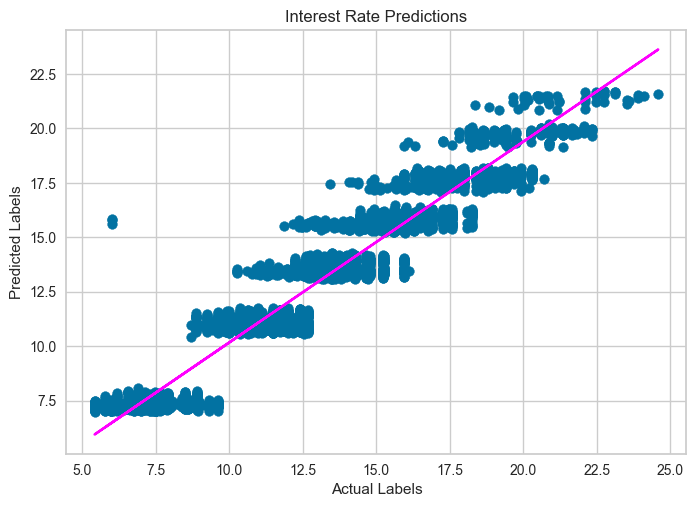

In [37]:
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Interest Rate Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

In [38]:
model.score(x_test,y_test)

0.9229889625677472

In [39]:
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)

rmse = np.sqrt(mse)
print("RMSE:", rmse)

r2 = r2_score(y_test, predictions)
print("R2:", r2)

MSE: 1.0559390648935623
RMSE: 1.027588957167973
R2: 0.9229889625677472


## Trying different Algorihms

Lasso() 

MSE: 10.565567435766093
RMSE: 3.2504718789379017
R2: 0.22943914441616875


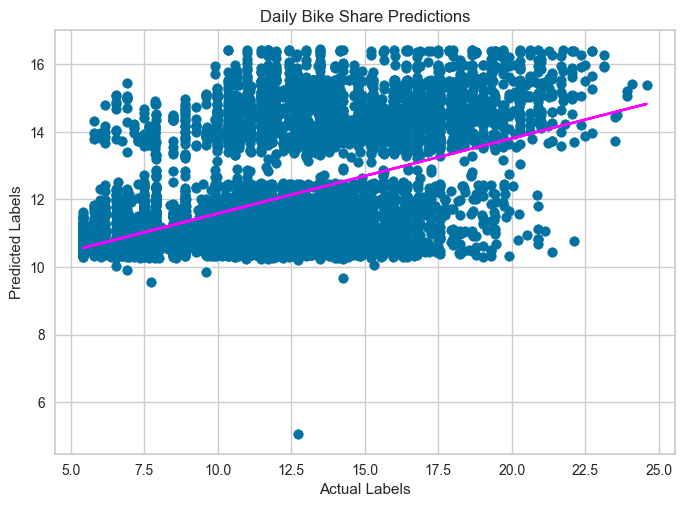

In [40]:
from sklearn.linear_model import Lasso

# Fit a lasso model on the training set
model = Lasso().fit(x_train, y_train)
print (model, "\n")

# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

In [41]:
# Decision tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text

# Train the model
model = DecisionTreeRegressor().fit(x_train, y_train)
print (model, "\n")

# Visualize the model tree
tree = export_text(model)
print(tree)

DecisionTreeRegressor() 

|--- feature_20 <= 0.50
|   |--- feature_21 <= 0.50
|   |   |--- feature_22 <= 0.50
|   |   |   |--- feature_24 <= 0.50
|   |   |   |   |--- feature_25 <= 0.50
|   |   |   |   |   |--- feature_23 <= 0.50
|   |   |   |   |   |   |--- feature_1 <= 48.00
|   |   |   |   |   |   |   |--- feature_0 <= 25337.50
|   |   |   |   |   |   |   |   |--- feature_0 <= 17450.00
|   |   |   |   |   |   |   |   |   |--- feature_11 <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- feature_0 <= 7687.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 28
|   |   |   |   |   |   |   |   |   |   |--- feature_0 >  7687.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 29
|   |   |   |   |   |   |   |   |   |--- feature_11 >  0.50
|   |   |   |   |   |   |   |   |   |   |--- feature_2 <= 13620.00
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |   |--- feature_2 >

MSE: 1.9371918131327686
RMSE: 1.3918303823141556
R2: 0.8587180300506648


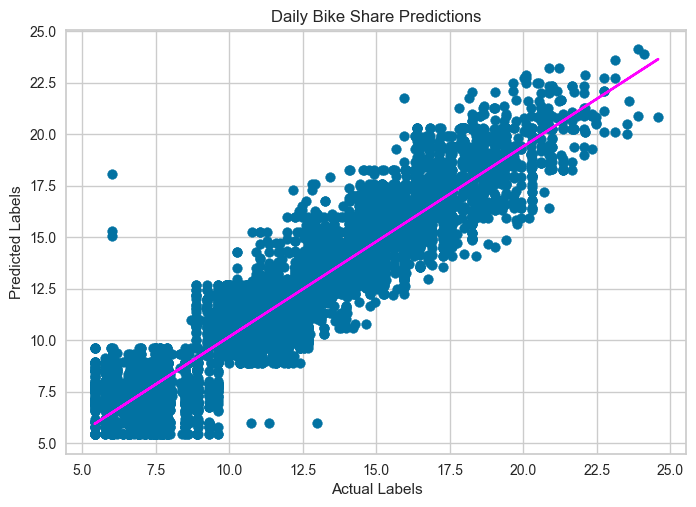

In [42]:
# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

RandomForestRegressor() 

MSE: 1.1921910288088584
RMSE: 1.0918750060372562
R2: 0.9130519260074448


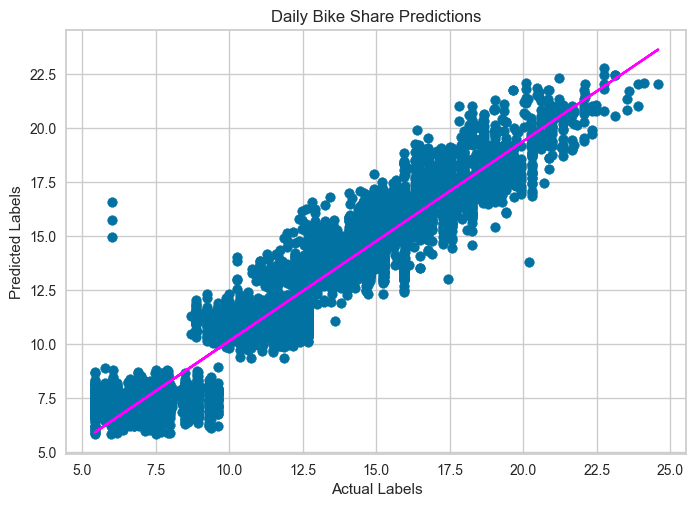

In [43]:
from sklearn.ensemble import RandomForestRegressor

# Train the model
model = RandomForestRegressor().fit(x_train, y_train)
print (model, "\n")

# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

GradientBoostingRegressor() 

MSE: 1.0112022027131833
RMSE: 1.00558550243785
R2: 0.9262516813007851


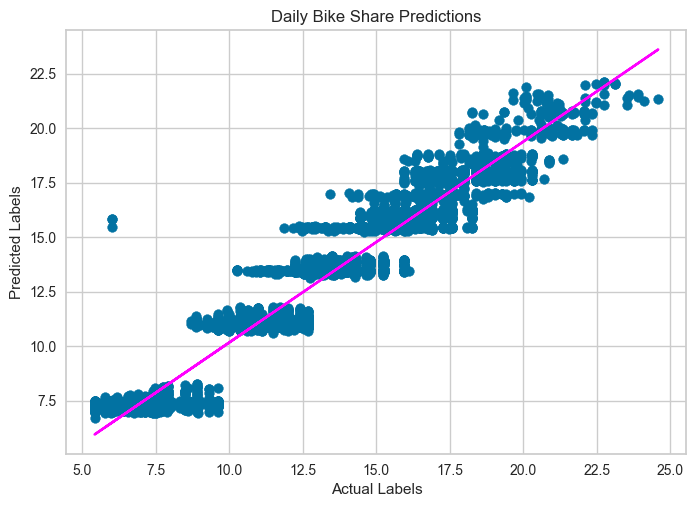

In [44]:
# Train the model
from sklearn.ensemble import GradientBoostingRegressor

# Fit a lasso model on the training set
model = GradientBoostingRegressor().fit(x_train, y_train)
print (model, "\n")

# Evaluate the model using the test data
predictions = model.predict(x_test)
mse = mean_squared_error(y_test, predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Daily Bike Share Predictions')
# overlay the regression line
z = np.polyfit(y_test, predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()